%md
# Big Data Analytics Project -Forecast
### Group 55 – NOVA IMS
##### Spring Semester 2024/2025

%md
## 📑 Table of Contents
- [1. Imports & Spark Setup](#1-imports-spark-setup)
- [2. Load & Feature-Engineer Taxi Data](#2-load-feature-engineer)
- [3. Aggregate & Enrich with Weather & Holidays](#3-enrich-dataset)
- [4. Fill Missing Hours & Rebuild Time-Features](#4-time-features)
- [5. Time Series Forecasting](#5-forecast)

#  1. Imports & Spark Setup

In [0]:
%pip install holidays

Python interpreter will be restarted.
Python interpreter will be restarted.


In [0]:
# %%
import os
import pandas as pd
import matplotlib.pyplot as plt
import holidays

# PySpark
import pyspark
from pyspark.sql import SparkSession, Window
import pyspark.sql.functions as F
from pyspark.sql.functions import (
    col, date_trunc, hour, dayofweek, dayofmonth, month,
    count, to_timestamp, year, lit, expr, sequence, explode,
    when, isnan,isnull,  mean, percentile_approx
)
from pyspark.sql.types import IntegerType

#from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error


from pyspark.ml import Pipeline
from pyspark.ml.feature import Imputer, VectorAssembler
from pyspark.ml.regression import RandomForestRegressor, GBTRegressor, LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder

# 2. Load & Feature-Engineer Taxi Data

In [0]:
df = spark.read.parquet("/dbfs/FileStore/clean/dataset_after_cleaning.parquet")
display(df)

VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,airport_fee,month,year,is_weekend,is_holiday,pickup_hour_decimal,trip_duration_minutes,trip_speed_mph,is_shared_ride,has_toll,PU_DO_pair,has_congestion_fee
2,2022-07-14T18:26:14.000+0000,2022-07-14T18:40:50.000+0000,1.0,2.52,1.0,151,116,1,12.0,1.0,0.5,0.0,0.0,0.3,13.8,0.0,0,7,2022,0,0,18.433333333333334,14.6,10.356164383561644,0,0,151-116,0
1,2024-07-08T18:45:37.000+0000,2024-07-08T18:50:08.000+0000,1.0,0.7,1.0,236,151,1,7.2,2.5,0.5,0.0,0.0,1.0,11.2,0.0,0,7,2024,0,0,18.75,4.516666666666667,9.29889298892989,0,0,236-151,0
2,2022-09-30T13:59:09.000+0000,2022-09-30T14:08:03.000+0000,2.0,0.88,1.0,113,148,2,7.5,0.0,0.5,0.0,0.0,0.3,10.8,2.5,0,9,2022,0,0,13.983333333333333,8.9,5.932584269662921,1,0,113-148,1
2,2024-06-10T22:13:10.000+0000,2024-06-10T22:24:32.000+0000,1.0,1.97,1.0,230,239,1,12.8,1.0,0.5,2.14,0.0,1.0,19.94,2.5,0,6,2024,0,0,22.216666666666665,11.366666666666667,10.39882697947214,0,0,230-239,1
2,2023-08-16T21:25:59.000+0000,2023-08-16T21:33:16.000+0000,5.0,0.83,1.0,68,48,1,8.6,1.0,0.5,1.36,0.0,1.0,14.96,2.5,0,8,2023,0,0,21.416666666666668,7.283333333333333,6.837528604118993,1,0,68-48,1
2,2023-05-05T16:00:49.000+0000,2023-05-05T16:36:49.000+0000,2.0,10.91,1.0,138,230,1,46.4,7.5,0.5,0.0,6.55,1.0,66.2,2.5,1,5,2023,0,0,16.0,36.0,18.183333333333334,1,1,138-230,1
2,2023-05-10T17:45:56.000+0000,2023-05-10T18:09:38.000+0000,1.0,1.91,1.0,100,162,1,20.5,2.5,0.5,5.4,0.0,1.0,32.4,2.5,0,5,2023,0,0,17.75,23.7,4.8354430379746836,0,0,100-162,1
2,2023-12-30T07:54:47.000+0000,2023-12-30T08:17:21.000+0000,2.0,10.06,1.0,239,138,1,40.1,5.0,0.5,11.21,6.94,1.0,67.25,2.5,0,12,2023,1,0,7.9,22.566666666666666,26.74741506646972,1,1,239-138,1
1,2024-11-01T10:21:01.000+0000,2024-11-01T10:35:47.000+0000,1.0,1.1,1.0,230,186,1,12.1,2.5,0.5,3.2,0.0,1.0,19.3,2.5,0,11,2024,0,0,10.35,14.766666666666667,4.469525959367946,0,0,230-186,1
2,2023-11-28T14:49:39.000+0000,2023-11-28T15:10:17.000+0000,1.0,1.16,1.0,79,164,1,17.0,0.0,0.5,4.2,0.0,1.0,25.2,2.5,0,11,2023,0,0,14.816666666666666,20.633333333333333,3.373182552504039,0,0,79-164,1


### Feature Engineering: Temporal Feature Extraction

We now extract new temporal features from the `tpep_pickup_datetime` column, such as hour of the day, day of the week, day of the month, and month. These features help capture seasonal and behavioral patterns in the trips. We also create a binary variable `is_weekend` to indicate whether the trip occurred on a weekend.


In [0]:
# Truncate to hour & extract calendar features
df = (
    df
    .withColumn("pickup_binned", date_trunc("hour", col("tpep_pickup_datetime")))
    .withColumn("hour", hour(col("pickup_binned")))
    .withColumn("day_of_week", dayofweek(col("pickup_binned")))
    .withColumn("day_of_month", dayofmonth(col("pickup_binned")))
    .withColumn("month", month(col("pickup_binned")))
    .withColumn("is_weekend", (col("day_of_week").isin([1,7])).cast(IntegerType()))
)


# 3. Aggregate & Enrich with Weather & Holidays

Since the goal of the project is to forecast hourly demand for taxis, we will perform an aggregation of the total number of trips per hour (`pickup_binned`). This transformation condenses the raw data into a format that is more reliable for time series modeling.

In [0]:
# Hourly taxi counts
df_counts = df.groupBy("pickup_binned").agg(count("*").alias("order_count"))

In [0]:
# One row per hour for the time features
df_timefeat = (
    df.select("pickup_binned", "hour", "day_of_week", "day_of_month", "month", "is_weekend")
      .dropDuplicates(["pickup_binned"])
)

In [0]:
# Join counts + time features → ~26K rows
df_small = df_counts.join(df_timefeat, on="pickup_binned", how="left")


Additionally, we will incorporate external weather variables with hourly timestamps. These variables help capture weather-related demand variations.

In [0]:
# Load hourly weather CSV & parse timestamp
weather_path = "/FileStore/tables/new_york_2022_01_01_to_2024_12_31.csv"
df_weather = (
    spark.read.option("header", True).csv(weather_path)
    .withColumn("pickup_binned", to_timestamp(col("datetime"), "yyyy-MM-dd'T'HH:mm:ss"))
    .select("pickup_binned", "temp", "feelslike", "dew", "humidity", "precip", "precipprob", "snow")
)


In [0]:
numeric_columns = ["temp", "feelslike", "dew", "humidity", "precip", "precipprob", "snow"]

# Count NaN only
nan_counts = df_weather.select([
    count(when(isnan(col(c)), c)).alias(c)
    for c in numeric_columns
])

# Show results
nan_counts.show()


+----+---------+---+--------+------+----------+----+
|temp|feelslike|dew|humidity|precip|precipprob|snow|
+----+---------+---+--------+------+----------+----+
|   0|        0|  0|       0|     0|         0|   0|
+----+---------+---+--------+------+----------+----+



In [0]:
# Merge weather → still ~26K rows
df_enriched = df_small.join(df_weather, on="pickup_binned", how="left")

In [0]:
print(df_enriched.columns)


['pickup_binned', 'order_count', 'hour', 'day_of_week', 'day_of_month', 'month', 'is_weekend', 'temp', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob', 'snow']


In [0]:

# Add holiday flag via UDF on small table
us_h = holidays.US(years=[2022,2023,2024])
@F.udf(IntegerType())
def is_hol(dt):
    return 0 if dt is None else int(dt.date() in us_h)

df_enriched = df_enriched.withColumn("is_holiday", is_hol(col("pickup_binned")))

In [0]:

# Filter only years 2022–2024
df_enriched = df_enriched.filter(year(col("pickup_binned")).isin(2022,2023,2024))

# 4. Fill Missing Hours & Rebuild Time-Features

To ensure that our time series includes all hourly timestamps, even when no trips occurred, we first compute the minimum and maximum pickup timestamps. Then, we generate a complete sequence of hourly intervals between these bounds. Finally, we perform a left join with the enriched dataset and fill any missing `order_count` values with 0. This guarantees a continuous time series with no missing hours.


In [0]:
# 4.1 Compute min/max and build a full-hour index
bounds = df_enriched.agg(
    F.min("pickup_binned").alias("start"),
    F.max("pickup_binned").alias("end")
).collect()[0]
start, end = bounds["start"], bounds["end"]

In [0]:
df_hours = (
    spark.range(1)
    .select(sequence(lit(start), lit(end), expr("interval 1 hour")).alias("all_hours"))
    .select(explode("all_hours").alias("pickup_binned"))
)


In [0]:
# Left-join and refill order_count=0
df_full = df_hours.join(df_enriched, on="pickup_binned", how="left") \
    .fillna({"order_count": 0})

In [0]:
# Recompute time features for any newly inserted hours
df_full = (
    df_full
    .withColumn("hour", hour(col("pickup_binned")))
    .withColumn("day_of_week", dayofweek(col("pickup_binned")))
    .withColumn("day_of_month", dayofmonth(col("pickup_binned")))
    .withColumn("month", month(col("pickup_binned")))
    .withColumn("is_weekend", (col("day_of_week").isin([1,7])).cast(IntegerType()))
)


In [0]:
df_full.printSchema()

root
 |-- pickup_binned: timestamp (nullable = false)
 |-- order_count: long (nullable = false)
 |-- hour: integer (nullable = false)
 |-- day_of_week: integer (nullable = false)
 |-- day_of_month: integer (nullable = false)
 |-- month: integer (nullable = false)
 |-- is_weekend: integer (nullable = false)
 |-- temp: string (nullable = true)
 |-- feelslike: string (nullable = true)
 |-- dew: string (nullable = true)
 |-- humidity: string (nullable = true)
 |-- precip: string (nullable = true)
 |-- precipprob: string (nullable = true)
 |-- snow: string (nullable = true)
 |-- is_holiday: integer (nullable = true)



In [0]:
display(df_full.limit(5))

pickup_binned,order_count,hour,day_of_week,day_of_month,month,is_weekend,temp,feelslike,dew,humidity,precip,precipprob,snow,is_holiday
2022-01-02T13:00:00.000+0000,3487,13,1,2,1,1,14,14,11.2,83.47,0,0,0,0
2022-01-03T00:00:00.000+0000,699,0,2,3,1,0,3.1,-0.5,-3,64.28,0,0,0,0
2022-01-05T06:00:00.000+0000,1096,6,4,5,1,0,0.7,-1.6,-2.6,78.12,0.3,100,0,0
2022-01-21T05:00:00.000+0000,452,5,6,21,1,0,-9.2,-16.9,-17.9,49.44,0,0,0,0
2022-01-21T20:00:00.000+0000,4415,20,6,21,1,0,-6.7,-12.2,-18.6,38.43,0,0,0,0


In [0]:
# List of columns to cast to float
string_columns_to_float = ["temp", "feelslike", "dew", "humidity", "precip", "precipprob", "snow"]

# Apply casting
df_full_casted = df_full
for c in string_columns_to_float:
    df_full_casted = df_full_casted.withColumn(c, col(c).cast("float"))



In [0]:
df_full_casted.printSchema()

root
 |-- pickup_binned: timestamp (nullable = false)
 |-- order_count: long (nullable = false)
 |-- hour: integer (nullable = false)
 |-- day_of_week: integer (nullable = false)
 |-- day_of_month: integer (nullable = false)
 |-- month: integer (nullable = false)
 |-- is_weekend: integer (nullable = false)
 |-- temp: float (nullable = true)
 |-- feelslike: float (nullable = true)
 |-- dew: float (nullable = true)
 |-- humidity: float (nullable = true)
 |-- precip: float (nullable = true)
 |-- precipprob: float (nullable = true)
 |-- snow: float (nullable = true)
 |-- is_holiday: integer (nullable = true)



In [0]:
numeric_columns = [c for c, dtype in df_full_casted.dtypes 
                   if c != 'pickup_binned' and dtype in ['float', 'double', 'int', 'integer', 'long']]

# Build NaN-only checks
nan_counts = df_full_casted.select([
    count(when(isnan(col(c)), c)).alias(c) 
    for c in numeric_columns
])
nan_counts.show(truncate=False)



+----+-----------+------------+-----+----------+----+---------+---+--------+------+----------+----+----------+
|hour|day_of_week|day_of_month|month|is_weekend|temp|feelslike|dew|humidity|precip|precipprob|snow|is_holiday|
+----+-----------+------------+-----+----------+----+---------+---+--------+------+----------+----+----------+
|0   |0          |0           |0    |0         |0   |0        |0  |0       |0     |0         |0   |0         |
+----+-----------+------------+-----+----------+----+---------+---+--------+------+----------+----+----------+



In [0]:
df_full_casted.write.mode("overwrite").parquet("/dbfs/FileStore/tables/model/df_full_casted.parquet")

# 5. Supervised Time Series Forecasting Using Lag-Based Regression Models

We approached the forecasting problem using a supervised regression framework. By transforming the time series into a feature-rich tabular dataset through the use of lag variables and rolling statistics, we enabled the application of Spark MLlib regression models (Random Forest, Gradient Boosted Trees, and Linear Regression). This method leverages temporal patterns while taking advantage of the scalability and flexibility of Spark’s distributed machine learning capabilities.

## 5.1 Add Lag & Rolling-Window Features

To capture temporal dependencies in the target variable (`order_count`), we add lag features and rolling-window statistics. Lag features provide the model with past values of the target, while rolling features summarize recent trends, such as the average or variability over the last few hours. These features are essential for transforming the time series into a supervised learning format suitable for machine learning models.


In [0]:
w = Window.orderBy("pickup_binned")
w24  = w.rowsBetween(-24, -1)
w168 = w.rowsBetween(-168, -1)

In [0]:
df_feat = (
    df_full_casted
    .withColumn("lag_1h",  F.lag("order_count", 1).over(w))
    .withColumn("lag_24h", F.lag("order_count", 24).over(w))
    .withColumn("roll24_mean", F.avg("order_count").over(w24))
    .withColumn("roll168_mean",F.avg("order_count").over(w168))
    .withColumn("roll24_std", F.stddev("order_count").over(w24))
)


In [0]:
df_feat

Out[25]: DataFrame[pickup_binned: timestamp, order_count: bigint, hour: int, day_of_week: int, day_of_month: int, month: int, is_weekend: int, temp: float, feelslike: float, dew: float, humidity: float, precip: float, precipprob: float, snow: float, is_holiday: int, lag_1h: bigint, lag_24h: bigint, roll24_mean: double, roll168_mean: double, roll24_std: double]

In [0]:
df_feat.select([
    count(when(isnull(col(c)), c)).alias(c)
    for c in df_feat.columns
]).show()

+-------------+-----------+----+-----------+------------+-----+----------+----+---------+---+--------+------+----------+----+----------+------+-------+-----------+------------+----------+
|pickup_binned|order_count|hour|day_of_week|day_of_month|month|is_weekend|temp|feelslike|dew|humidity|precip|precipprob|snow|is_holiday|lag_1h|lag_24h|roll24_mean|roll168_mean|roll24_std|
+-------------+-----------+----+-----------+------------+-----+----------+----+---------+---+--------+------+----------+----+----------+------+-------+-----------+------------+----------+
|            0|          0|   0|          0|           0|    0|         0|  62|       62| 62|      62|    62|        62|  62|        62|     1|     24|          1|           1|         2|
+-------------+-----------+----+-----------+------------+-----+----------+----+---------+---+--------+------+----------+----+----------+------+-------+-----------+------------+----------+



In [0]:
df_feat.write.mode("overwrite").parquet("/dbfs/FileStore/tables/model/df_feat.parquet")


In [0]:
df_feat = spark.read.parquet("/dbfs/FileStore/tables/model/df_feat.parquet")

## 5.2 FEATURE PREPARATION & SELECTION

In [0]:
# Define candidate feature columns (exclude timestamp & label)
features = [c for c, _ in df_feat.dtypes if c not in ["pickup_binned", "order_count"]]


In [0]:
# Time‐aware splits
train = df_feat.filter(col("pickup_binned") < "2024-01-01").repartition(4)
val   = df_feat.filter((col("pickup_binned") >= "2024-01-01") & (col("pickup_binned") < "2024-07-01")).repartition(4)
test  = df_feat.filter(col("pickup_binned") >= "2024-07-01").repartition(4)


In [0]:
medians = {
    col_name: train.selectExpr(f"percentile_approx({col_name}, 0.5)").first()[0]
    for col_name in features
}

train = train.fillna(medians)
val = val.fillna(medians)
test = test.fillna(medians)

In [0]:
assembler = VectorAssembler(inputCols=features, outputCol="features")

In [0]:
# Model definitions + hyperparameter grids
models_grids = {
    "rf": (
        RandomForestRegressor(labelCol="order_count", featuresCol="features", seed=42),
        ParamGridBuilder()
            .addGrid(RandomForestRegressor.numTrees, [50,100])
            .addGrid(RandomForestRegressor.maxDepth, [5,10])
            .build()
    ),
    "gbt": (
        GBTRegressor(labelCol="order_count", featuresCol="features", seed=42),
        ParamGridBuilder()
            .addGrid(GBTRegressor.maxIter, [50,100])
            .addGrid(GBTRegressor.maxDepth, [5,10])
            .build()
    ),
    "lr": (
        LinearRegression(labelCol="order_count", featuresCol="features"),
        ParamGridBuilder()
            .addGrid(LinearRegression.regParam, [0.0, 0.1, 0.5])
            .addGrid(LinearRegression.elasticNetParam, [0.0, 0.5, 1.0])
            .build()
    )
}

In [0]:
# Define metrics to evaluate
metric_names = ["rmse", "mae", "r2"]

# Containers
results = []          # to collect (model_name, metric_name, value)
models_info = {}      # to store best PipelineModel for each

# Hyperparameter tuning + validation
for name, (estimator, grid) in models_grids.items():
    pipeline = Pipeline(stages=[assembler, estimator])
    
    # Use RMSE for model selection during CV
    evaluator_rmse = RegressionEvaluator(labelCol="order_count", predictionCol="prediction", metricName="rmse")
    
    cv = CrossValidator(
        estimator=pipeline,
        estimatorParamMaps=grid,
        evaluator=evaluator_rmse,  # still use RMSE to choose best model
        numFolds=3,
        parallelism=2
    )
    
    # Train model with CV
    cvModel = cv.fit(train)
    
    # Apply best model to validation data
    val_predictions = cvModel.transform(val)
    
    # Evaluate all metrics
    for metric in metric_names:
        evaluator = RegressionEvaluator(labelCol="order_count", predictionCol="prediction", metricName=metric)
        value = evaluator.evaluate(val_predictions)
        results.append((name, metric, value))
    
    # Store best model
    models_info[name] = cvModel.bestModel

# Convert results to DataFrame
results_df = spark.createDataFrame(results, ["model", "metric", "value"])
results_df.orderBy("model", "metric").show()


+-----+------+------------------+
|model|metric|             value|
+-----+------+------------------+
|  gbt|   mae| 259.8052502970579|
|  gbt|    r2|0.9741614120544116|
|  gbt|  rmse| 371.8452690581778|
|   lr|   mae|440.28344693973656|
|   lr|    r2|0.9337368617612958|
|   lr|  rmse| 595.4754653111075|
|   rf|   mae| 359.1481601823662|
|   rf|    r2|0.9544343742528251|
|   rf|  rmse| 493.7948335089428|
+-----+------+------------------+



All three models were evaluated on the validation set using RMSE, MAE, and R². The Gradient Boosted Trees model consistently outperformed the others, achieving the lowest RMSE (371.85) and MAE (259.81), as well as the highest R² (0.974). This indicates strong predictive accuracy and a good fit to the data. Random Forest performed moderately well, while Linear Regression showed the weakest performance overall.

In [0]:
# Select best model by validation RMSE
rmse_results = [r for r in results if r[1] == "rmse"]
best_name, _, best_rmse = min(rmse_results, key=lambda x: x[2])
best_model = models_info[best_name]

print(f"Selected model: {best_name} (val RMSE = {best_rmse:.2f})")


Selected model: gbt (val RMSE = 371.85)


In [0]:
# Save the best model pipeline for later use
best_model.write().overwrite().save("/mnt/models/best_pipeline_model")


In [0]:
# Final evaluation on TEST
pred_test = best_model.transform(test)
test_metrics = {}

for metric in metric_names:
    evaluator = RegressionEvaluator(labelCol="order_count", predictionCol="prediction", metricName=metric)
    score = evaluator.evaluate(pred_test)
    test_metrics[metric] = score
    print(f"Test {metric.upper()} for {best_name}: {score:.2f}")

Test RMSE for gbt: 391.34
Test MAE for gbt: 276.96
Test R2 for gbt: 0.97


In [0]:
# Compute the mean and store the value
media_order_count = test.select(mean("order_count")).first()[0]

# Now calculate the relative error
relative_error = (rmse_test / media_order_count) * 100
print(f"Relative error: {relative_error:.2f}%")

Relative error: 9.74%


In [0]:
# 9) Re-train the best pipeline on TRAIN + VALIDATION for production use
train_val = train.union(val)


In [0]:
# Rebuild the pipeline with the selected estimator (rf or gbt)
best_estimator, _ = models_grids[best_name]
final_pipeline = Pipeline(stages=[assembler, best_estimator])
# Fit the pipeline on train + validation data
final_model = final_pipeline.fit(train_val)

In [0]:
# Save the final retrained pipeline
final_model.write().overwrite().save("/FileStore/tables/model/final_pipeline_model")

In [0]:
from pyspark.ml import PipelineModel


In [0]:
# Load the retrained production-ready pipeline
final_model = PipelineModel.load("/FileStore/tables/model/final_pipeline_model")

## Visualization

In [0]:
# 1) Generate predictions for TRAIN and TEST using the final retrained model
df_train_pred = final_model.transform(train_val) \
    .select("pickup_binned", "order_count", "prediction") \
    .toPandas()

df_test_pred = final_model.transform(test) \
    .select("pickup_binned", "order_count", "prediction") \
    .toPandas()

In [0]:
df_train_pred = df_train_pred.sort_values("pickup_binned")
df_test_pred = df_test_pred.sort_values("pickup_binned")

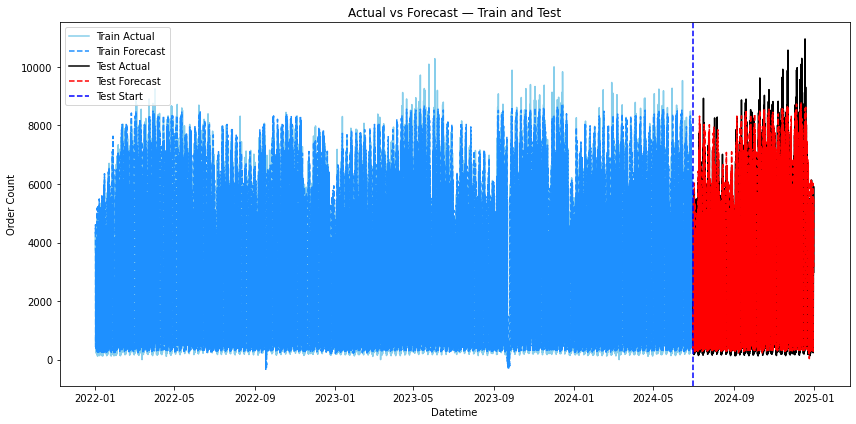

In [0]:
plt.figure(figsize=(12, 6))

# TRAIN section
plt.plot(df_train_pred["pickup_binned"], df_train_pred["order_count"], label="Train Actual", color="skyblue")
plt.plot(df_train_pred["pickup_binned"], df_train_pred["prediction"], label="Train Forecast", linestyle="--", color="dodgerblue")

# TEST section
plt.plot(df_test_pred["pickup_binned"], df_test_pred["order_count"], label="Test Actual", color="black")
plt.plot(df_test_pred["pickup_binned"], df_test_pred["prediction"], label="Test Forecast", linestyle="--", color="red")

# Vertical split line
plt.axvline(pd.Timestamp("2024-07-01"), color="blue", linestyle="--", label="Test Start")

plt.xlabel("Datetime")
plt.ylabel("Order Count")
plt.title("Actual vs Forecast — Train and Test")
plt.legend()
plt.tight_layout()
plt.show()

#### 🔍 Interpretation 

This visualization provides valuable insight into the model's forecasting ability across different time periods. We observe that:

- 🟦 **Training Period**: The forecast closely follows the actual values, indicating that the model successfully captured the historical patterns in the training data. This reflects a good fit to the underlying time dynamics.
  
- 🔴 **Test Period**: Despite the natural variability in taxi demand, the model manages to follow the main trends and fluctuations. This suggests that the model generalizes reasonably well to unseen data.

🔻 **High Demand Underestimation**: One notable limitation is that the model struggles to predict very high demand levels. Specifically, during periods with more than **8,000 orders per hour**, the forecasts tend to underestimate the actual values. This suggests that the model may have difficulty capturing extreme peaks, possibly due to their rarity or the lack of strong predictive signals in the available features.

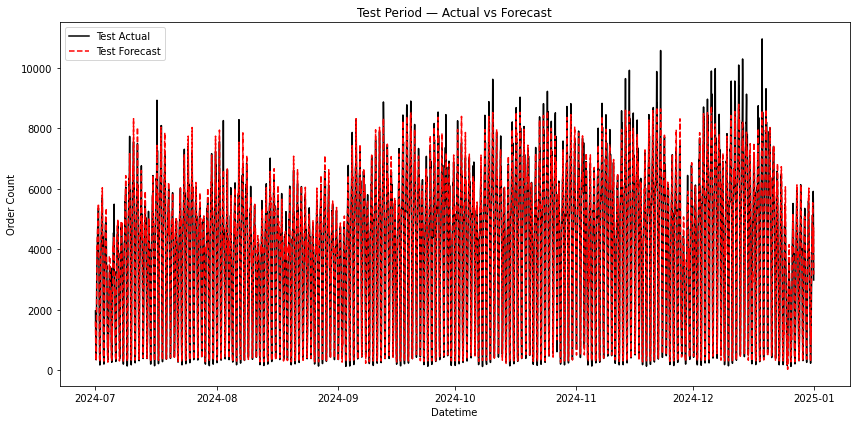

In [0]:
# 2) Plot actual vs predicted for TEST only
plt.figure(figsize=(12, 6))

plt.plot(df_test_pred["pickup_binned"], df_test_pred["order_count"], label="Test Actual", color="black")
plt.plot(df_test_pred["pickup_binned"], df_test_pred["prediction"], label="Test Forecast", linestyle="--", color="red")

plt.xlabel("Datetime")
plt.ylabel("Order Count")
plt.title("Test Period — Actual vs Forecast")
plt.legend()
plt.tight_layout()
plt.show()


#### 📊 Test Period – Detailed Forecast Evaluation

This plot focuses exclusively on the **test period**, allowing a closer inspection of the model’s forecasting behaviour in unseen data.

##### Key Observations:

- ⚫ **Actual demand** (black line) shows a **clear daily periodicity**, with peaks and valleys corresponding to intraday fluctuations typical in taxi services.
- 🔴 **Forecasts** (red dashed line) follow the general trend but consistently **underestimate the actual values** at the highest peaks — particularly during late November and December.
- 📉 **Prediction Lag at Peaks**: In multiple instances, the forecast appears slightly delayed or smoother than the actual spikes, which may indicate that the model is averaging out sharp changes.

##### Summary:

Although the model succeeds in capturing the **overall seasonality and weekday/weekend patterns**, it shows difficulty in **accurately predicting sudden surges in demand**, especially above **8,000 orders/hour**.

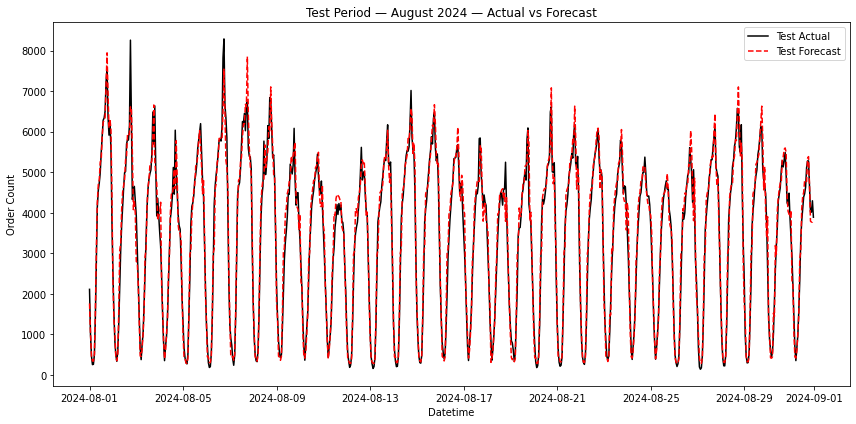

In [0]:
# Filter for August 2024 (month == 8)
df_test_august = df_test_pred[
    (df_test_pred["pickup_binned"].dt.month == 8) &
    (df_test_pred["pickup_binned"].dt.year == 2024)
].sort_values("pickup_binned")

# Plot for August 2024
plt.figure(figsize=(12, 6))
plt.plot(df_test_august["pickup_binned"], df_test_august["order_count"], label="Test Actual", color="black")
plt.plot(df_test_august["pickup_binned"], df_test_august["prediction"], label="Test Forecast", linestyle="--", color="red")

plt.xlabel("Datetime")
plt.ylabel("Order Count")
plt.title("Test Period — August 2024 — Actual vs Forecast")
plt.legend()
plt.tight_layout()
plt.show()

#### 📆 Focused Forecast Evaluation August 2024

This plot zooms in on the test period for **August 2024**, offering a clearer picture of the model’s forecasting performance at a daily level.

##### Key Observations:

- The model captures the **recurring daily demand pattern** very accurately, showing clear alignment between actual and predicted values.
- The **forecasted values (red dashed line)** closely follow the **actual demand (black line)** across most days, demonstrating a strong ability to generalize in this stable time window.
- Minor deviations are observed during **sharp transitions**, such as rapid spikes or drops, but these are limited and do not affect the overall trend.
- The model effectively learns the **cyclical structure** of the data, predicting the peaks and valleys typical of intraday taxi usage.

##### Conclusion:

The model performs with **high accuracy and consistency** throughout this period, making it a reliable tool for short-term forecasting under stable behavioural patterns.
